In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import cv2
import os

In [5]:
df = pd.read_csv("../Car_Images_metadata_fixed.csv")

In [6]:
df.head()

,image_path,label,brand,model,year,filename,L_real_m,W_real_m,H_real_m,WB_real_m,Noise_Level_dB
0,Car_Images_Dataset/BMW/328i_2013/Stock/BMW_328...,0,BMW,328i,2013,BMW_328i_2013_Stock_1763816756457.jpeg,4.5,1.8,1.4,2.7,77.7
1,Car_Images_Dataset/BMW/328i_2013/Stock/BMW_328...,0,BMW,328i,2013,BMW_328i_2013_Stock_1763816770582.jpeg,4.5,1.8,1.4,2.7,77.7
2,Car_Images_Dataset/BMW/328i_2013/Stock/BMW_328...,0,BMW,328i,2013,BMW_328i_2013_Stock_1763816784068.jpeg,4.5,1.8,1.4,2.7,77.7
3,Car_Images_Dataset/BMW/328i_2013/Stock/BMW_328...,0,BMW,328i,2013,BMW_328i_2013_Stock_1763816795763.jpeg,4.5,1.8,1.4,2.7,77.7
4,Car_Images_Dataset/BMW/328i_2013/Stock/BMW_328...,0,BMW,328i,2013,BMW_328i_2013_Stock_1763816805646.jpeg,4.5,1.8,1.4,2.7,77.7


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3533 entries, 0 to 3532
Data columns (total 11 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   image_path      3533 non-null   object 
 1   label           3533 non-null   int64  
 2   brand           3533 non-null   object 
 3   model           3533 non-null   object 
 4   year            3533 non-null   int64  
 5   filename        3533 non-null   object 
 6   L_real_m        3533 non-null   float64
 7   W_real_m        3533 non-null   float64
 8   H_real_m        3533 non-null   float64
 9   WB_real_m       3533 non-null   float64
 10  Noise_Level_dB  3533 non-null   float64
dtypes: float64(5), int64(2), object(4)
memory usage: 303.7+ KB


In [8]:
df = df.dropna()

In [9]:
df.shape

(3533, 11)

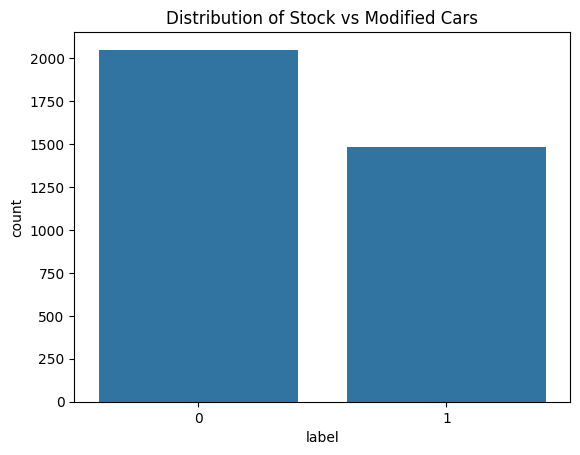

In [10]:
sns.countplot(x='label', data=df)
plt.title('Distribution of Stock vs Modified Cars')
plt.show()

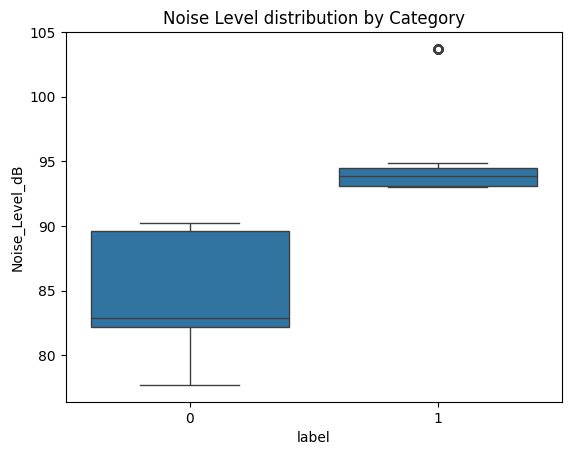

In [11]:
sns.boxplot(x='label', y='Noise_Level_dB', data=df)
plt.title('Noise Level distribution by Category')
plt.show()

In [12]:
# Check the range overlap
print("Stock Range:", df[df['label']==0]['Noise_Level_dB'].min(), "-", df[df['label']==0]['Noise_Level_dB'].max())
print("Modified Range:", df[df['label']==1]['Noise_Level_dB'].min(), "-", df[df['label']==1]['Noise_Level_dB'].max())

Stock Range: 77.7 - 90.2
Modified Range: 93.0 - 103.7


In [13]:
np.random.seed(42)

stock_lookup = df[df['label'] == 0].groupby(['brand', 'model'])['Noise_Level_dB'].mean().to_dict()

def force_overlap(row):
    base_db = stock_lookup.get((row['brand'], row['model']), row['Noise_Level_dB'])
    
    if row['label'] == 1:
        if np.random.rand() < 0.5:
            return base_db + np.random.normal(0, 0.5)
        else:
            return base_db + np.random.uniform(2, 8)
    return base_db + np.random.normal(0, 0.5)

df['Noise_Level_dB'] = df.apply(force_overlap, axis=1)

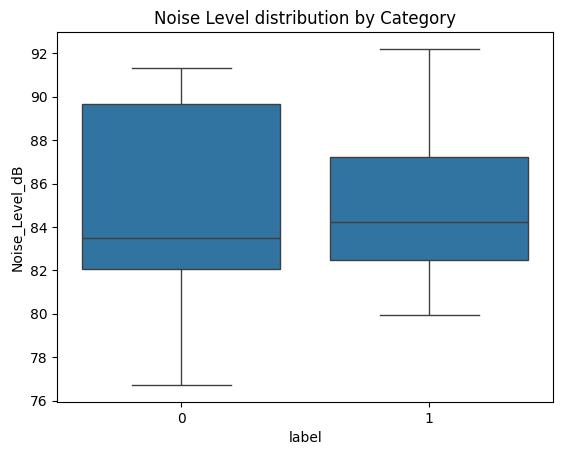

In [14]:
sns.boxplot(x='label', y='Noise_Level_dB', data=df)
plt.title('Noise Level distribution by Category')
plt.show()

In [15]:
# Check the range overlap
print("Stock Range:", df[df['label']==0]['Noise_Level_dB'].min(), "-", df[df['label']==0]['Noise_Level_dB'].max())
print("Modified Range:", df[df['label']==1]['Noise_Level_dB'].min(), "-", df[df['label']==1]['Noise_Level_dB'].max())

Stock Range: 76.72016493806011 - 91.31711102182499
Modified Range: 79.92952257777014 - 92.20275969155503


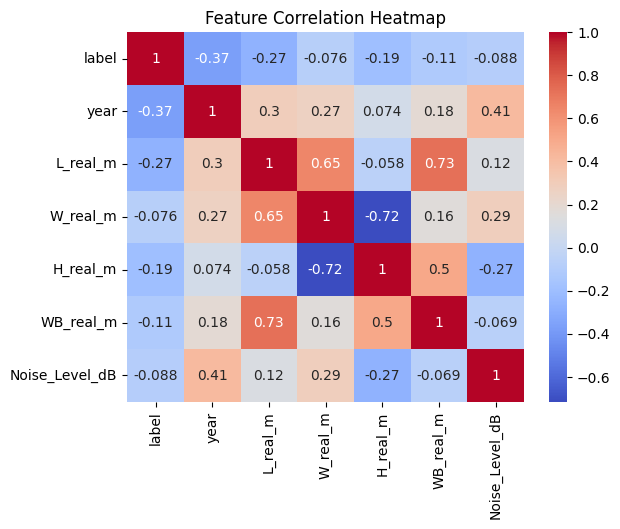

In [16]:
sns.heatmap(df.select_dtypes(include=['number']).corr(), annot=True, cmap='coolwarm')
plt.title('Feature Correlation Heatmap')
plt.show()

In [17]:
df.head()

,image_path,label,brand,model,year,filename,L_real_m,W_real_m,H_real_m,WB_real_m,Noise_Level_dB
0,Car_Images_Dataset/BMW/328i_2013/Stock/BMW_328...,0,BMW,328i,2013,BMW_328i_2013_Stock_1763816756457.jpeg,4.5,1.8,1.4,2.7,77.948357
1,Car_Images_Dataset/BMW/328i_2013/Stock/BMW_328...,0,BMW,328i,2013,BMW_328i_2013_Stock_1763816770582.jpeg,4.5,1.8,1.4,2.7,77.630868
2,Car_Images_Dataset/BMW/328i_2013/Stock/BMW_328...,0,BMW,328i,2013,BMW_328i_2013_Stock_1763816784068.jpeg,4.5,1.8,1.4,2.7,78.023844
3,Car_Images_Dataset/BMW/328i_2013/Stock/BMW_328...,0,BMW,328i,2013,BMW_328i_2013_Stock_1763816795763.jpeg,4.5,1.8,1.4,2.7,78.461515
4,Car_Images_Dataset/BMW/328i_2013/Stock/BMW_328...,0,BMW,328i,2013,BMW_328i_2013_Stock_1763816805646.jpeg,4.5,1.8,1.4,2.7,77.582923


In [18]:
X = df.drop("label", axis=1)
Y = df['label']

In [19]:
X.head()


,image_path,brand,model,year,filename,L_real_m,W_real_m,H_real_m,WB_real_m,Noise_Level_dB
0,Car_Images_Dataset/BMW/328i_2013/Stock/BMW_328...,BMW,328i,2013,BMW_328i_2013_Stock_1763816756457.jpeg,4.5,1.8,1.4,2.7,77.948357
1,Car_Images_Dataset/BMW/328i_2013/Stock/BMW_328...,BMW,328i,2013,BMW_328i_2013_Stock_1763816770582.jpeg,4.5,1.8,1.4,2.7,77.630868
2,Car_Images_Dataset/BMW/328i_2013/Stock/BMW_328...,BMW,328i,2013,BMW_328i_2013_Stock_1763816784068.jpeg,4.5,1.8,1.4,2.7,78.023844
3,Car_Images_Dataset/BMW/328i_2013/Stock/BMW_328...,BMW,328i,2013,BMW_328i_2013_Stock_1763816795763.jpeg,4.5,1.8,1.4,2.7,78.461515
4,Car_Images_Dataset/BMW/328i_2013/Stock/BMW_328...,BMW,328i,2013,BMW_328i_2013_Stock_1763816805646.jpeg,4.5,1.8,1.4,2.7,77.582923


In [20]:
Y.head()

0    0
1    0
2    0
3    0
4    0
Name: label, dtype: int64

In [21]:
preprocessor = ColumnTransformer(
    transformers=[
        ('cat', OneHotEncoder(handle_unknown='ignore'), ['brand', 'model']),
        ('num', StandardScaler(), ['year', 'L_real_m', 'W_real_m', 'H_real_m', 'WB_real_m', 'Noise_Level_dB'])
    ])

In [22]:
# Optional: Handle imbalance
#smote = SMOTE(random_state=42)
#X_train, Y_train = smote.fit_resample(X_train, Y_train)

In [23]:
images = []
base_dir = ".."
for path in df['image_path']:
    full_path = os.path.join(base_dir, path)
    img = cv2.imread(full_path)
    img = cv2.resize(img, (224, 224)) # Resize Image
    images.append(img)
images = np.array(images) / 255.0  # Normalize

In [24]:
X_tab = df[['brand', 'model', 'year', 'L_real_m', 'W_real_m', 'H_real_m', 'WB_real_m', 'Noise_Level_dB']]

X_img = images

Y = df['label'].to_numpy()


In [25]:
X_tab_train, X_tab_test, X_img_train, X_img_test, Y_train, Y_test = train_test_split(X_tab, X_img, Y,test_size=0.2,random_state=42,stratify=Y)


In [26]:
X_tab_train = preprocessor.fit_transform(X_tab_train)
X_tab_test = preprocessor.transform(X_tab_test)

In [27]:
#Data augmentation
datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    horizontal_flip=True
)
datagen.fit(X_img_train)

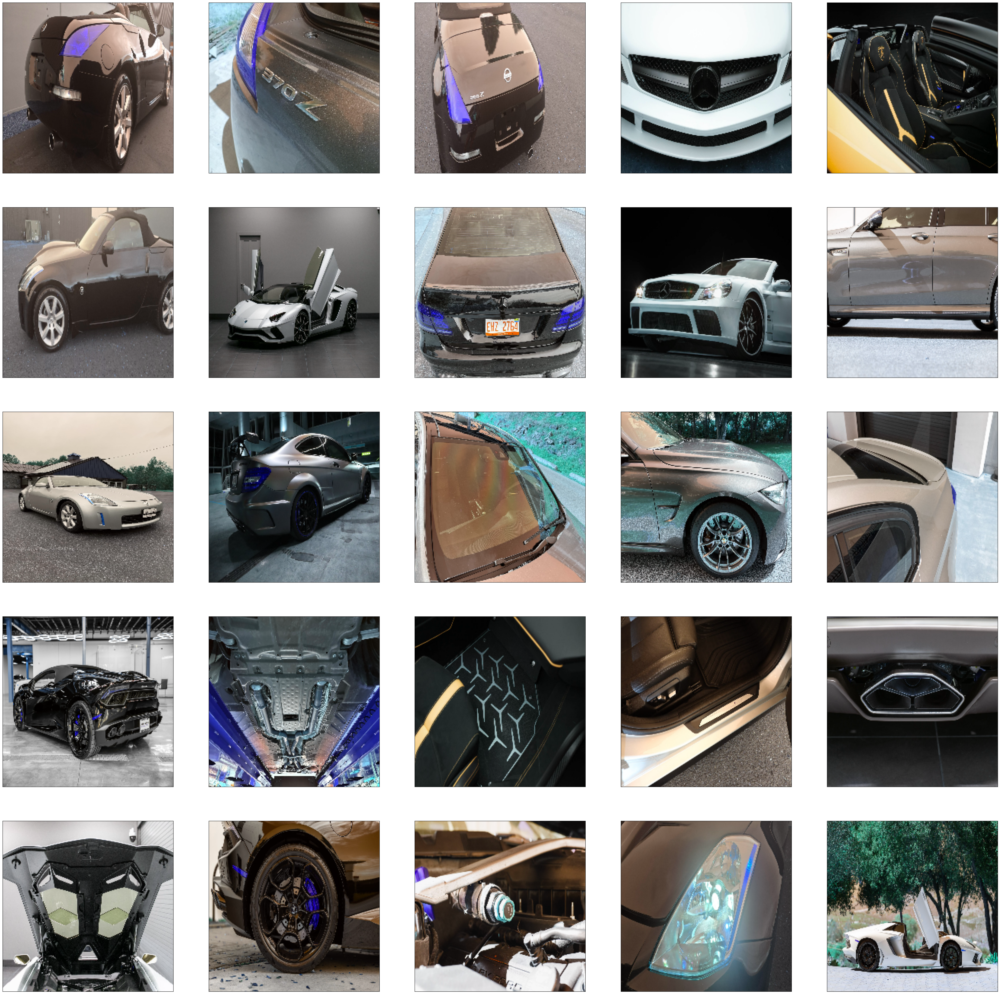

In [28]:
#some examples of the data
plt.figure(figsize=(50, 50))
for i in range(25):    
    plt.subplot(5, 5, i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(X_img_train[i], cmap=plt.cm.binary)  
plt.show()

In [29]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tensorflow import keras

# Setting random seeds to get reproducible results
np.random.seed(0)
import tensorflow as tf
tf.random.set_seed(1)

In [30]:
 X_img_train.shape

(2826, 224, 224, 3)

In [31]:
Y_train.shape

(2826,)

In [47]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Flatten
import numpy as np

# Flatten the images first
# X_img_train shape: (2826, 224, 224, 3)
X_train_flat = X_img_train.reshape(X_img_train.shape[0], -1)  # shape -> (2826, 224*224*3)

model = Sequential([
    Dense(1024, activation='relu', input_shape=(224*224*3,)),  # first hidden layer
    Dropout(0.5),

    Dense(512, activation='relu'),
    Dropout(0.5),

    Dense(128, activation='relu'),
    Dropout(0.3),

    Dense(1, activation='sigmoid')  # binary output
])

model.compile(
    loss='binary_crossentropy',  # correct for binary classification
    optimizer='adam',
    metrics=['accuracy']
)

model.summary()

# Train



Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_6 (Dense)                 │ (None, 1024)           │   154,141,696 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 512)            │       524,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 128)            │        65,664 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_6 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 154,732,289 (590.26 MB)

 Trainable params: 154,732,289 (590.26 MB)

 Non-trainable params: 0 (0.00 B)

In [49]:
model.fit(X_train_flat, Y_train, epochs=10, batch_size=128)


Epoch 1/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 44s 2s/step - accuracy: 0.5290 - loss: 2.6695
Epoch 2/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 42s 2s/step - accuracy: 0.5343 - loss: 1.2135
Epoch 3/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 41s 2s/step - accuracy: 0.5407 - loss: 0.8196
Epoch 4/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 41s 2s/step - accuracy: 0.5715 - loss: 0.7045
Epoch 5/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 41s 2s/step - accuracy: 0.5814 - loss: 0.6920
Epoch 6/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 41s 2s/step - accuracy: 0.5828 - loss: 0.6932
Epoch 7/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 41s 2s/step - accuracy: 0.5846 - loss: 0.6808
Epoch 8/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 40s 2s/step - accuracy: 0.5796 - loss: 0.6928
Epoch 9/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 39s 2s/step - accuracy: 0.5878 - loss: 0.6798
Epoch 10/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 41s 2s/step - accuracy: 0.5839 - loss: 0.6735


23/23 ━━━━━━━━━━━━━━━━━━━━ 2s 83ms/step


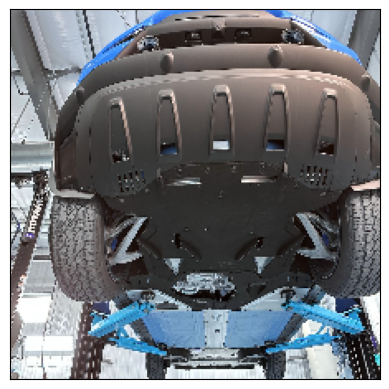

The true label is: 0
The predicted label is: 0
The model is correct 416 times out of 707
The accuracy is 0.5884


In [ ]:
# Flatten the test images
X_test_flat = X_img_test.reshape(X_img_test.shape[0], -1)  # shape -> (num_samples, 224*224*3)


predictions_vector = model.predict(X_test_flat)


predictions = (predictions_vector > 0.5).astype(int).flatten()

# Example: show 10th image
import matplotlib.pyplot as plt
plt.imshow(X_img_test[9])
plt.xticks([])
plt.yticks([])
plt.show()

print("The true label is:", Y_test[9])
print("The predicted label is:", predictions[9])

# Compute accuracy manually
import numpy as np
num_correct = np.sum(predictions == Y_test)
accuracy = num_correct / len(Y_test)

print(f"The model is correct {num_correct} times out of {len(Y_test)}")
print(f"The accuracy is {accuracy:.4f}")


In [53]:
X_tab_train.shape


(2826, 32)

In [ ]:
Y_test.shape

(2826,)

In [ ]:
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import SimpleRNN, Dense, Dropout


if not isinstance(X_tab_train, np.ndarray):
    X_tab_train = X_tab_train.toarray()
    X_tab_test  = X_tab_test.toarray()


X_tab_train_rnn = X_tab_train.reshape(X_tab_train.shape[0], X_tab_train.shape[1], 1)
X_tab_test_rnn  = X_tab_test.reshape(X_tab_test.shape[0], X_tab_test.shape[1], 1)


model = Sequential([
    SimpleRNN(64, activation='tanh', input_shape=(32, 1)),  # RNN layer
    Dropout(0.3),
    Dense(32, activation='relu'),
    Dropout(0.2),
    Dense(1, activation='sigmoid')  # binary output
])

model.compile(
    loss='binary_crossentropy',
    optimizer='adam',
    metrics=['accuracy']
)

model.summary()


history = model.fit(
    X_tab_train_rnn,
    Y_train,
    epochs=20,
    batch_size=32,
    validation_data=(X_tab_test_rnn, Y_test)
)

scores = model.evaluate(X_tab_test_rnn, Y_test, verbose=0)
print(f"Test Accuracy: {scores[1]*100:.2f}%")


c:\Users\Mohamed\AppData\Local\Programs\Python\Python313\Lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ simple_rnn (SimpleRNN)          │ (None, 64)             │         4,224 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_7 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_8 (Dropout)             │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 6,337 (24.75 KB)

 Trainable params: 6,337 (24.75 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/20
89/89 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.7976 - loss: 0.4405 - val_accuracy: 0.8685 - val_loss: 0.2974
Epoch 2/20
89/89 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9094 - loss: 0.2533 - val_accuracy: 0.9604 - val_loss: 0.1473
Epoch 3/20
89/89 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9664 - loss: 0.1220 - val_accuracy: 1.0000 - val_loss: 0.0342
Epoch 4/20
89/89 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9926 - loss: 0.0435 - val_accuracy: 1.0000 - val_loss: 0.0079
Epoch 5/20
89/89 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9989 - loss: 0.0159 - val_accuracy: 1.0000 - val_loss: 0.0035
Epoch 6/20
89/89 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9975 - loss: 0.0122 - val_accuracy: 1.0000 - val_loss: 0.0016
Epoch 7/20
89/89 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 1.0000 - loss: 0.0048 - val_accuracy: 1.0000 - val_loss: 8.6606e-04
Epoch 8/20
89/89 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9989 - loss: 0.0078 - val_accuracy: 1.0000 - val_l